<a href="https://colab.research.google.com/github/Alimv81/Preprocessing-road-cars-images/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install numpy
!pip install pandas
!pip install opencv-python
!pip install opencv-python-headless
!pip install matplotlib
!pip install tensorflow
!pip install sklearn
!pip install ultralytics

In [ ]:
import requests

download_links = [
    'https://drive.usercontent.google.com/download?id=1sQx_KPJ5KN9OLNm6vCmJNKLAvbAt5GE7&export=download&authuser=0',
    'https://drive.usercontent.google.com/download?id=1Tfc7E7sUoCLosasijwsBR2C0tll-DGHR&export=download&authuser=0',
    'https://drive.usercontent.google.com/download?id=1E3x067gH_9_3PnPoJ4xKTj3FOHVpksRN&export=download&authuser=0&confirm=t&uuid=14ae1143-b78b-4f4d-babd-2c61854e9a94&at=APZUnTVbjFlN4EbPJHEOBwr6MBV6%3A17175849270907gH_9_3PnPoJ4xKTj3FOHVpksRN/view?usp=sharing',
]

In [ ]:
for i in range(1, len(download_links)+1):
  file_url = download_links[i-1]
  r = requests.get(file_url)

  with open(f"video_{i}.mp4", "wb") as file:
    file.write(r.content)

  print(f'part {i} done')
  del r

part 1 done
part 2 done
part 3 done


In [ ]:
import json
import cv2 as cv
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from ultralytics import YOLO
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from google.colab.patches import cv2_imshow

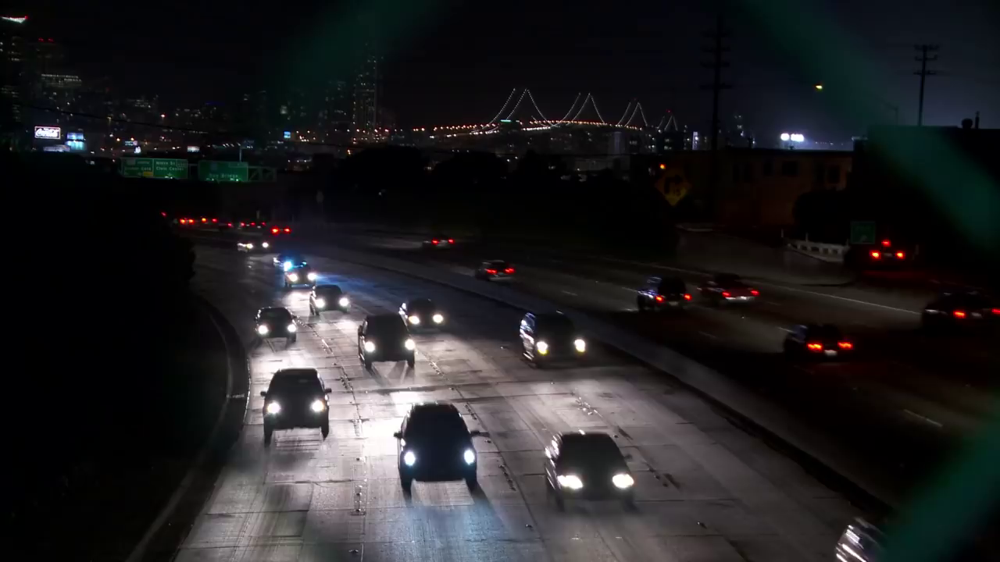

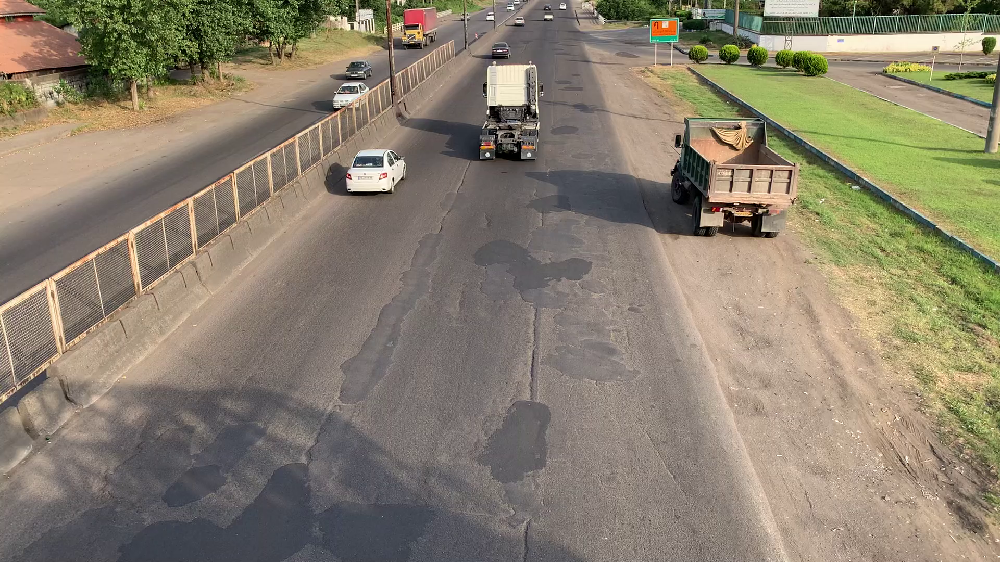

In [ ]:
for i in range(1, len(download_links)+1):

  cap = cv.VideoCapture(f'video_{i}.mp4')

  ret, frame = cap.read()
  if not ret:
    continue
  cv2_imshow(frame)

  cap.release()
  cv.destroyAllWindows()

In [ ]:
!wget https://github.com/patrick013/Object-Detection---Yolov3/raw/master/model/yolov3.weights
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg -O yolov3.cfg
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names -O coco.names
!wget https://github.com/ultralytics/assets/releases/download/v8.1.0/yolov8n.pt -O yolov8n.pt

In [ ]:
X = []
y = []

In [ ]:
def constant_size(img):
  img = cv.resize(img, (800, 600))
  img = img.astype(np.uint8)
  return img

In [ ]:
each_video_samples = 300
whole_samples = each_video_samples * 3

In [ ]:
def build_frames_list(feature_list):
  frame_interval_ms = 10000
  for i in range(1, len(download_links)+1):
    break_for = False
    counter = 0
    cap = cv.VideoCapture(f'video_{i}.mp4')

    while cap.isOpened():
      ret, frame = cap.read()

      frame = constant_size(frame)
      if not ret:
        break

      feature_list.append(frame)

      counter += 1
      if counter % (each_video_samples) == 0:
        print(f'added {each_video_samples//3} more data. total number: {counter}')

      if cv.waitKey(frame_interval_ms) & 0xFF == ord('q'):
        break

      if len(feature_list) == whole_samples:
        break_for = True
        break
      if counter == each_video_samples:
        break


    print(f'video {i} has been finished')

    if break_for == True:
      cap.release()
      cv.destroyAllWindows()
      break

    cap.release()
    cv.destroyAllWindows()

In [ ]:
build_frames_list(X)

video 1 has been finished
added 100 more data. total number: 300
video 2 has been finished
added 100 more data. total number: 300
video 3 has been finished


In [ ]:
wanted_classes = ['car', 'bus', 'bicycle', 'motorbike', 'truck']

In [ ]:
net = cv.dnn.readNet("yolov3.weights", "yolov3.cfg")
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

layer_names = net.getLayerNames()

try:
  output_layers_indices = net.getUnconnectedOutLayers()
  output_layers = [layer_names[i - 1] for i in output_layers_indices]
except IndexError:
  output_layers_indices = net.getUnconnectedOutLayers().flatten()
  output_layers = [layer_names[i - 1] for i in output_layers_indices]

In [ ]:
def merge_img_label(img, label, confidences=None):
  boxes, class_ids = label
  if confidences is None:
    indexes = cv.dnn.NMSBoxes(boxes, 0.5, 0.4)
  else:
    indexes = cv.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

  font = cv.FONT_HERSHEY_PLAIN
  for i in range(len(boxes)):
    if i in indexes:
      x, y, w, h = boxes[i]
      label = str(classes[class_ids[i]])
      color = (0, 255, 0)
      cv.rectangle(img, (x, y), (x + w, y + h), color, 2)
      cv.putText(img, label, (x, y - 5), font, 1, color, 2)

  return img

In [ ]:
def detect_cars_yolo3(img, show_boxes=True, return_boxes=False):
  height, width, channels = img.shape

  blob = cv.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
  net.setInput(blob)
  outs = net.forward(output_layers)

  class_ids = []
  confidences = []
  boxes = []

  for out in outs:
    for detection in out:
      scores = detection[5:]
      class_id = np.argmax(scores)
      confidence = scores[class_id]
      if len(boxes) <= 10 and confidence > 0.5 and classes[class_id] in wanted_classes:
        center_x = int(detection[0] * width)
        center_y = int(detection[1] * height)
        w = int(detection[2] * width)
        h = int(detection[3] * height)

        x = int(center_x - w / 2)
        y = int(center_y - h / 2)

        boxes.append([x, y, w, h])
        boxes.sort()
        ind = boxes.index([x, y, w, h])

        confidences.insert(ind, float(confidence))
        class_ids.insert(ind, class_id)

  if show_boxes:
    merge_img_label(img, (boxes, class_ids), confidences)
    cv2_imshow(img)
  if return_boxes:
    return np.array(boxes), np.array(class_ids)

In [ ]:
def detect_cars_yolo8(img, show_boxes=True, return_boxes=False):
  model = YOLO('yolov8n.pt')

  results = model.predict(source=img)

  class_names = model.names

  def filter_results(results, desired_classes):
      filtered_boxes = []
      filtered_class_ids = []
      filtered_confidences = []

      for result in results:
          for box, class_id, confidence in zip(result.boxes.xyxy, result.boxes.cls, result.boxes.conf):
              class_name = class_names[int(class_id)]
              if class_name in wanted_classes:
                  filtered_boxes.append(box)
                  filtered_class_ids.append(class_id)
                  filtered_confidences.append(confidence)

      return filtered_boxes, filtered_class_ids, filtered_confidences

  filtered_boxes, filtered_class_ids, filtered_confidences = filter_results(results, wanted_classes)

  if show_boxes:
    for box, class_id, confidence in zip(filtered_boxes, filtered_class_ids, filtered_confidences):
        x1, y1, x2, y2 = map(int, box)
        label = f"{class_names[int(class_id)]}: {confidence:.2f}"
        color = (0, 255, 0)
        cv.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv.putText(img, label, (x1, y1 - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    cv2_imshow(img)

  if return_boxes:
    return np.array(filtered_boxes), np.array(filtered_class_ids)

In [ ]:
def extract_labels(feature_list, label_list, detect_function=detect_cars_yolo3):
  for i, img in enumerate(feature_list):
    if (i+1) % 100 == 0:
      print(f'finished {i+1} data')
    bboxes, class_ids = detect_function(img, show_boxes=False, return_boxes=True)
    label_list.append((bboxes, class_ids))

In [ ]:
extract_labels(X, y, detect_function=detect_cars_yolo8)


0: 480x640 8 cars, 313.3ms
Speed: 6.0ms preprocess, 313.3ms inference, 24.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 7 cars, 180.7ms
Speed: 6.0ms preprocess, 180.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 8 cars, 174.7ms
Speed: 5.5ms preprocess, 174.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 8 cars, 180.8ms
Speed: 3.6ms preprocess, 180.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 8 cars, 175.9ms
Speed: 6.4ms preprocess, 175.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 9 cars, 165.0ms
Speed: 3.5ms preprocess, 165.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 9 cars, 159.9ms
Speed: 5.3ms preprocess, 159.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 8 cars, 269.6ms
Speed: 3.8ms preprocess, 269.6ms inference, 1.7ms postprocess per ima

In [ ]:
def preprocess_1(img):
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

  edges = cv.Canny(gray, 70, 135)

  img = cv.merge((edges, edges, edges))

  return img

In [ ]:
def preprocess_2(image):
  def enhance_contrast(image):
    lab = cv.cvtColor(image, cv.COLOR_BGR2LAB)
    l, a, b = cv.split(lab)
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv.merge((cl, a, b))
    enhanced_image = cv.cvtColor(limg, cv.COLOR_LAB2BGR)
    return enhanced_image
  image = enhance_contrast(image)
  image = cv.GaussianBlur(image, (5, 5), 0)
  return image

In [ ]:
def preprocess_3(img):
  hh, ww = img.shape[:2]

  lower = np.array([200, 200, 200])
  upper = np.array([255, 255, 255])

  thresh = cv.inRange(img, lower, upper)

  kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (20,20))
  morph = cv.morphologyEx(thresh, cv.MORPH_CLOSE, kernel)

  mask = 255 - morph

  result = cv.bitwise_and(img, img, mask=mask)

  return result

In [ ]:
def preprocess_4(img):
  def histogram_stretching(image):
      image = image

      min_val = np.min(image)
      max_val = np.max(image)

      stretched_image = (image - min_val) * (255.0 / (max_val - min_val))
      stretched_image = np.clip(stretched_image, 0, 255)
      stretched_image = stretched_image.astype(np.uint8)

      return stretched_image


  def correct_lighting(image, clip_limit=2.0, tile_grid_size=(40, 40)):
      lab = cv.cvtColor(image, cv.COLOR_BGR2LAB)

      l, a, b = cv.split(lab)

      clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
      cl = clahe.apply(l)

      limg = cv.merge((cl, a, b))

      final = cv.cvtColor(limg, cv.COLOR_LAB2BGR)

      return final

  def resize_image(image, scale_factor, interpolation_method):
      height, width = image.shape[:2]

      new_width = int(width * scale_factor)
      new_height = int(height * scale_factor)

      resized_image = cv.resize(image, (new_width, new_height), interpolation=interpolation_method)

      return resized_image

  def preprocess_image(image):
      image = image

      gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

      blurred_image = cv.GaussianBlur(gray_image, (5, 5), 0)

      edges = cv.Canny(blurred_image, 100, 200)

      return edges


  corrected_image = correct_lighting(img)
  stretched_image = histogram_stretching(corrected_image)
  resized_nearest = resize_image(corrected_image, 4.0, cv.INTER_NEAREST)
  processed_image = preprocess_image(resized_nearest)

  processed_image = cv.merge((processed_image, processed_image, processed_image))


  return processed_image

In [ ]:
def preprocess_5(image):
    """
    Convert to grayscale, equalize histogram, and convert back to BGR.
    """
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    equalized = cv.equalizeHist(gray)
    return cv.cvtColor(equalized, cv.COLOR_GRAY2BGR)

def preprocess_6(image):
    """
    Apply Gaussian blur and sharpen the image.
    """
    blurred = cv.GaussianBlur(image, (5, 5), 0)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv.filter2D(blurred, -1, kernel)
    return sharpened

def preprocess_7(image):
    """
    Adjust brightness, contrast, and apply Gaussian blur.
    """
    brightness = 30
    contrast = 30
    img = np.int16(image)
    img = img * (contrast / 127 + 1) - contrast + brightness
    img = np.clip(img, 0, 255)
    adjusted = np.uint8(img)
    blurred = cv.GaussianBlur(adjusted, (5, 5), 0)
    return blurred

def preprocess_8(image):
    """
    Convert to grayscale, apply histogram equalization, and sharpen.
    """
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    equalized = cv.equalizeHist(gray)
    equalized_bgr = cv.cvtColor(equalized, cv.COLOR_GRAY2BGR)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv.filter2D(equalized_bgr, -1, kernel)
    return sharpened

def preprocess_9(image):
    """
    Flip the image horizontally and adjust brightness and contrast.
    """
    flipped = cv.flip(image, 1)
    brightness = 30
    contrast = 30
    img = np.int16(flipped)
    img = img * (contrast / 127 + 1) - contrast + brightness
    img = np.clip(img, 0, 255)
    adjusted = np.uint8(img)
    return adjusted

def preprocess_10(image):
    """
    Apply Gaussian blur, add salt and pepper noise, and normalize.
    """
    blurred = cv.GaussianBlur(image, (5, 5), 0)
    amount = 0.05
    salt_vs_pepper = 0.5
    row, col, ch = blurred.shape
    s_vs_p = salt_vs_pepper
    out = np.copy(blurred)

    num_salt = np.ceil(amount * blurred.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in blurred.shape]
    out[coords[0], coords[1], :] = 1

    num_pepper = np.ceil(amount * blurred.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in blurred.shape]
    out[coords[0], coords[1], :] = 0

    normalized = out / 255.0
    return (normalized * 255).astype(np.uint8)

def preprocess_11(image):
    """
    Convert to grayscale, apply Gaussian blur, and adjust brightness and contrast.
    """
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    blurred = cv.GaussianBlur(gray, (5, 5), 0)
    brightness = 30
    contrast = 30
    img = np.int16(blurred)
    img = img * (contrast / 127 + 1) - contrast + brightness
    img = np.clip(img, 0, 255)
    adjusted = np.uint8(img)
    return cv.cvtColor(adjusted, cv.COLOR_GRAY2BGR)

Saving rtv.jpg to rtv (1).jpg
Uploaded file: rtv (1).jpg

0: 480x640 14 cars, 1 bus, 2 trucks, 1 traffic light, 367.0ms
Speed: 4.3ms preprocess, 367.0ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


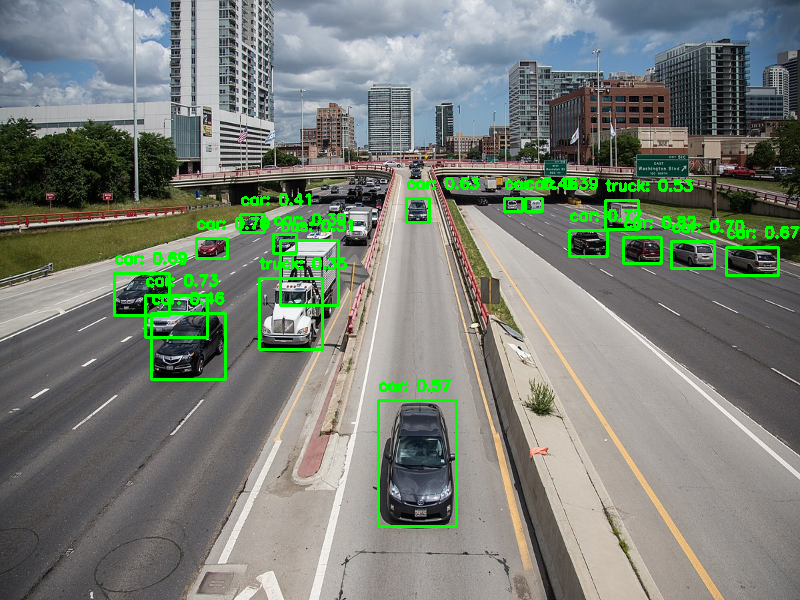


0: 480x640 13 cars, 1 truck, 1 traffic light, 193.0ms
Speed: 5.1ms preprocess, 193.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


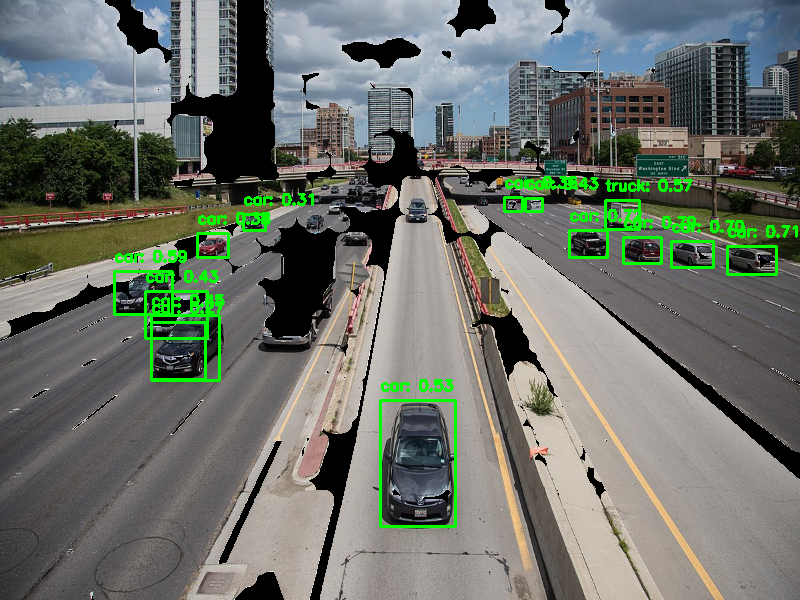

In [ ]:
from google.colab import files

if 'uploaded' not in locals():
  uploaded = files.upload()

for file_name in uploaded.keys():
  print(f"Uploaded file: {file_name}")
  img = cv.imread(file_name)
  img = constant_size(img)
  img_ = preprocess_3(img)
  detect_cars_yolo8(img)
  detect_cars_yolo8(img_, return_boxes=True)

In [ ]:
example_index = 250

preprocess_1 examples


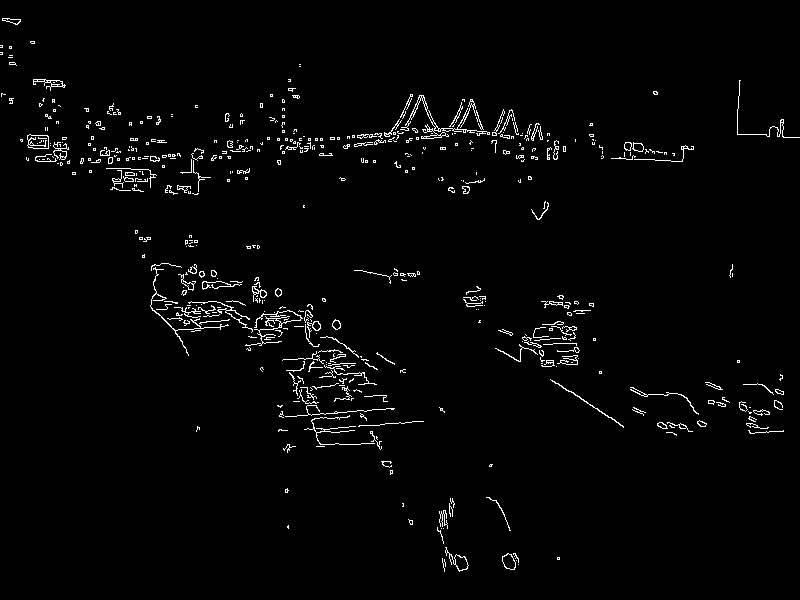


0: 480x640 (no detections), 195.4ms
Speed: 4.0ms preprocess, 195.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


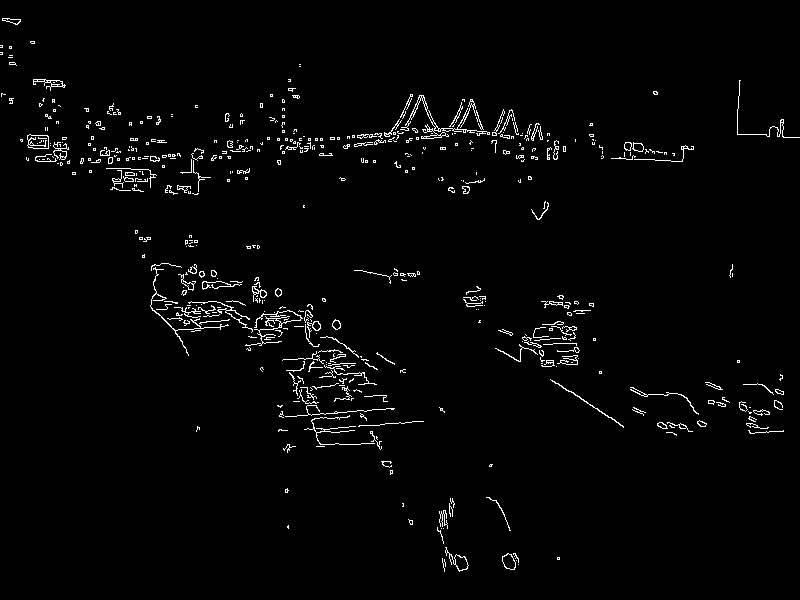

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_2 examples


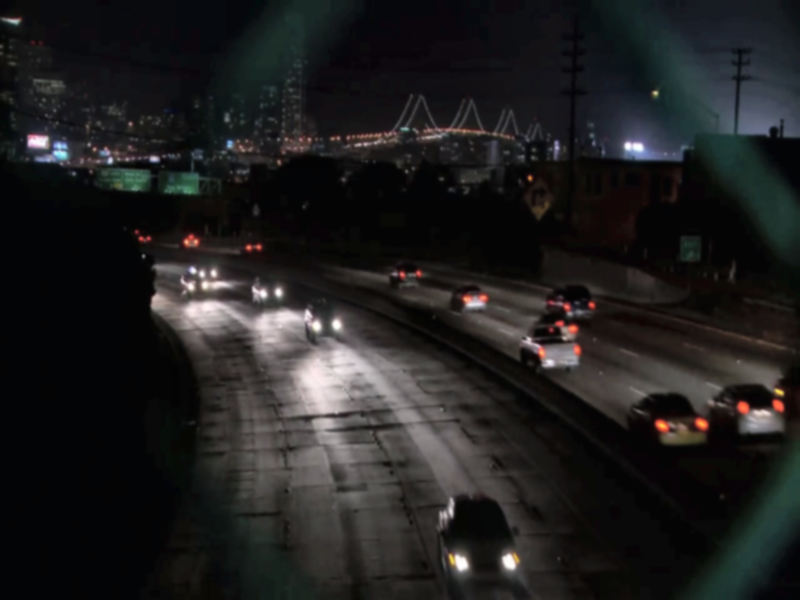


0: 480x640 1 person, 8 cars, 183.4ms
Speed: 4.9ms preprocess, 183.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


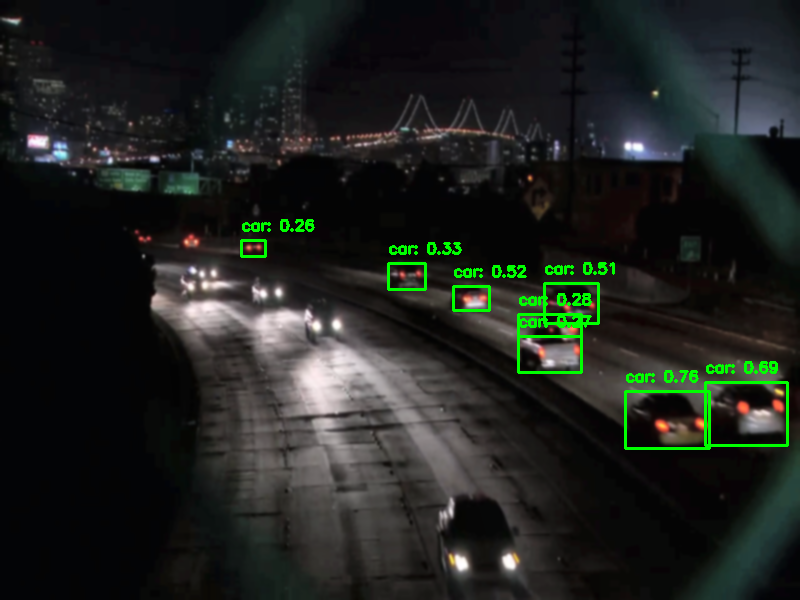

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_3 examples


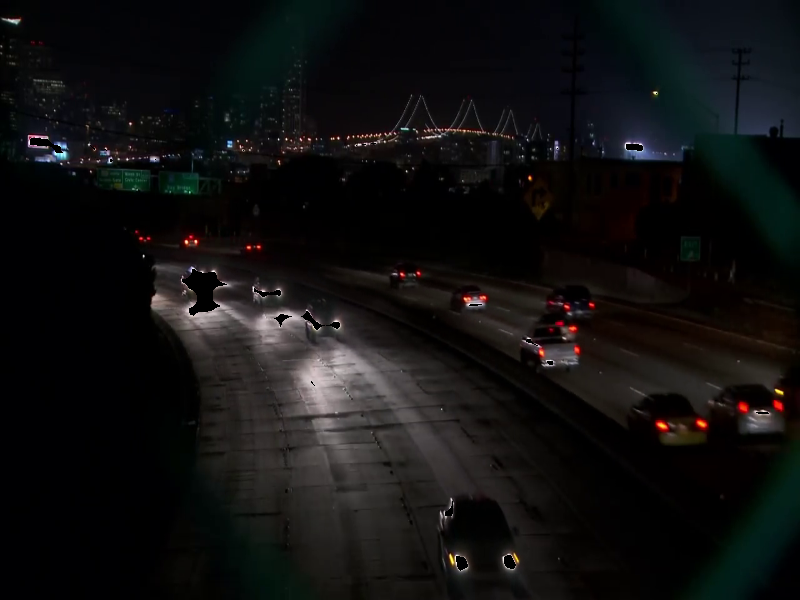


0: 480x640 10 cars, 191.1ms
Speed: 4.3ms preprocess, 191.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


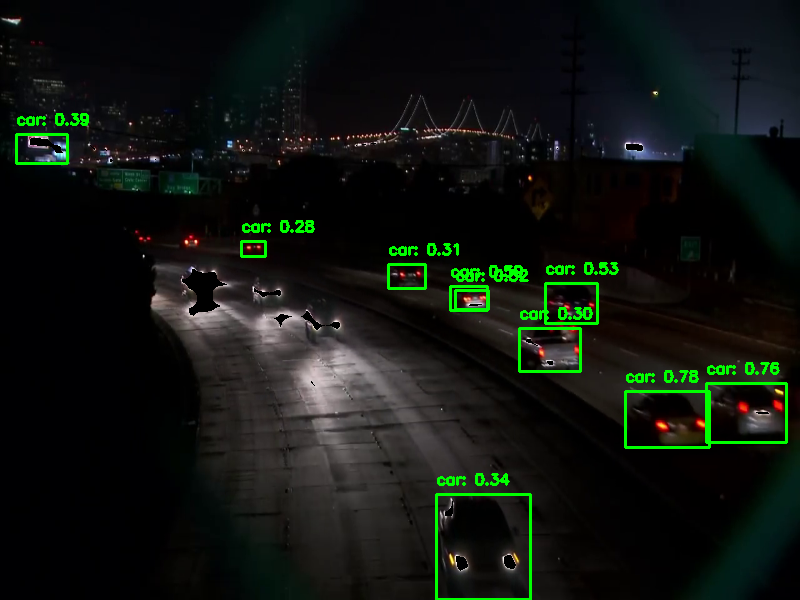

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_4 examples


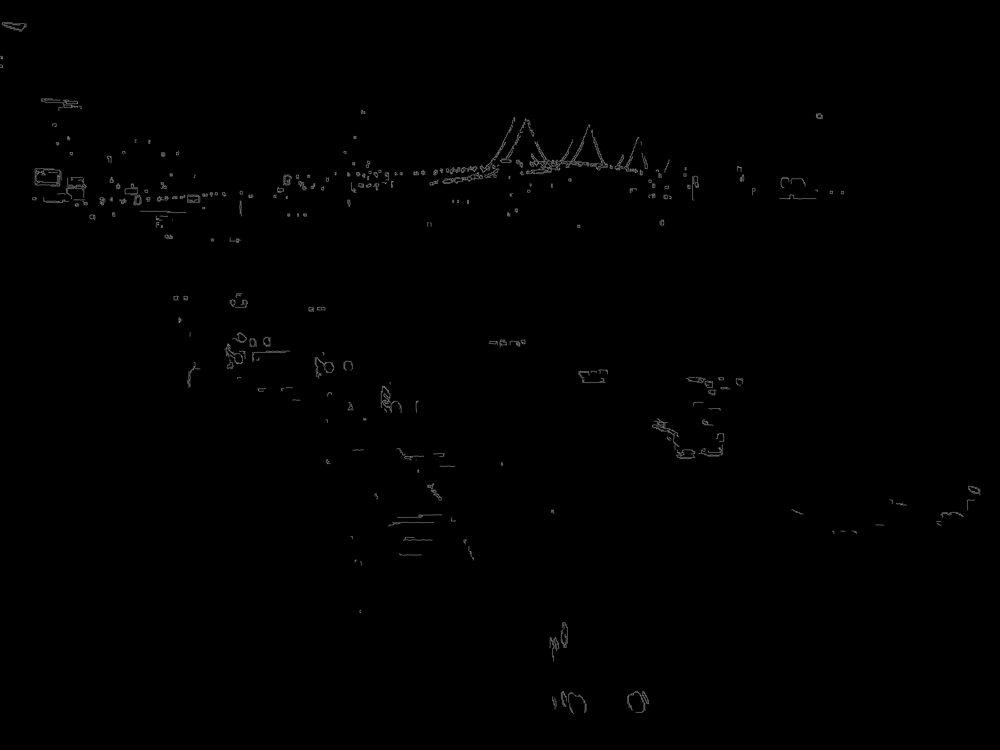


0: 480x640 (no detections), 198.9ms
Speed: 5.0ms preprocess, 198.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


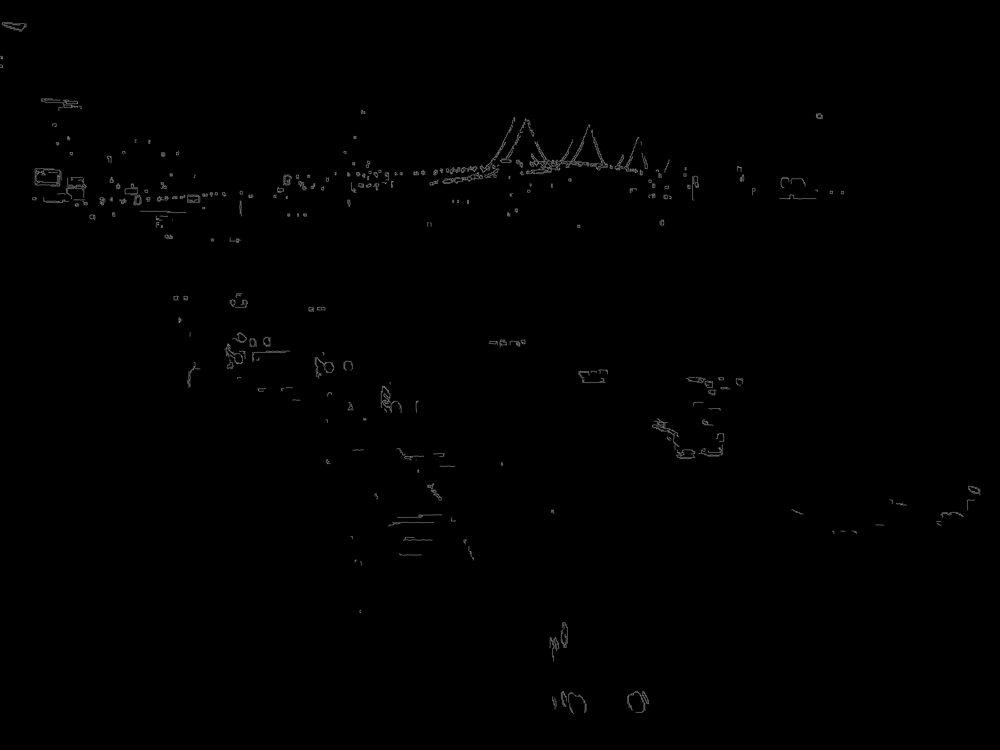

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_5 examples


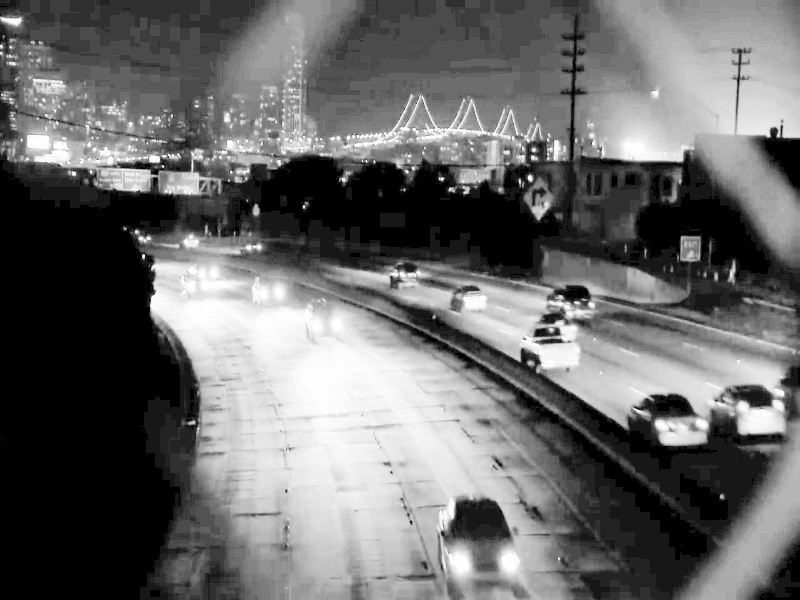


0: 480x640 5 cars, 320.1ms
Speed: 6.1ms preprocess, 320.1ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


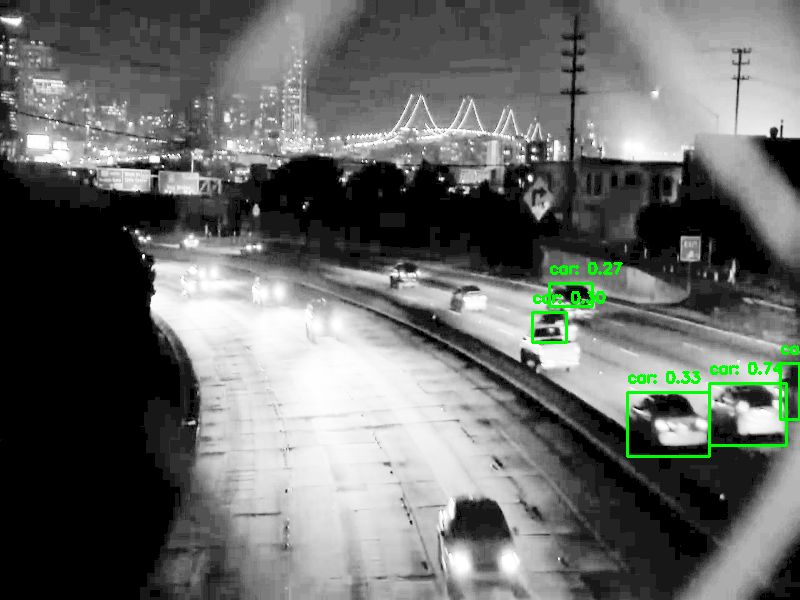

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_6 examples


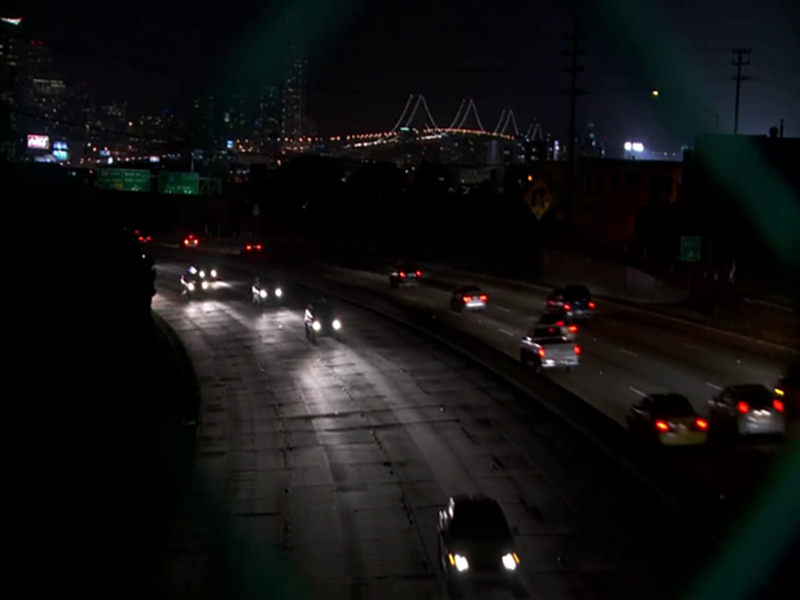


0: 480x640 7 cars, 213.9ms
Speed: 5.9ms preprocess, 213.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


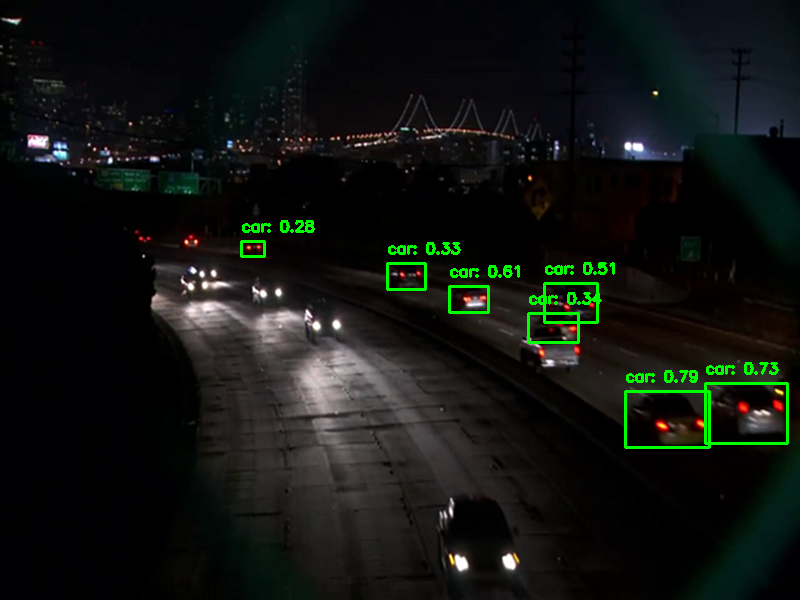

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_7 examples


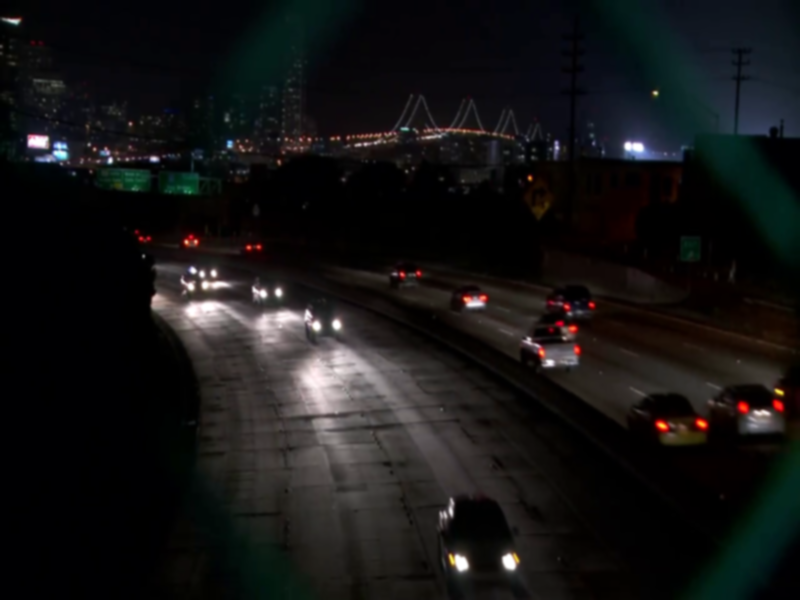


0: 480x640 7 cars, 209.0ms
Speed: 5.3ms preprocess, 209.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


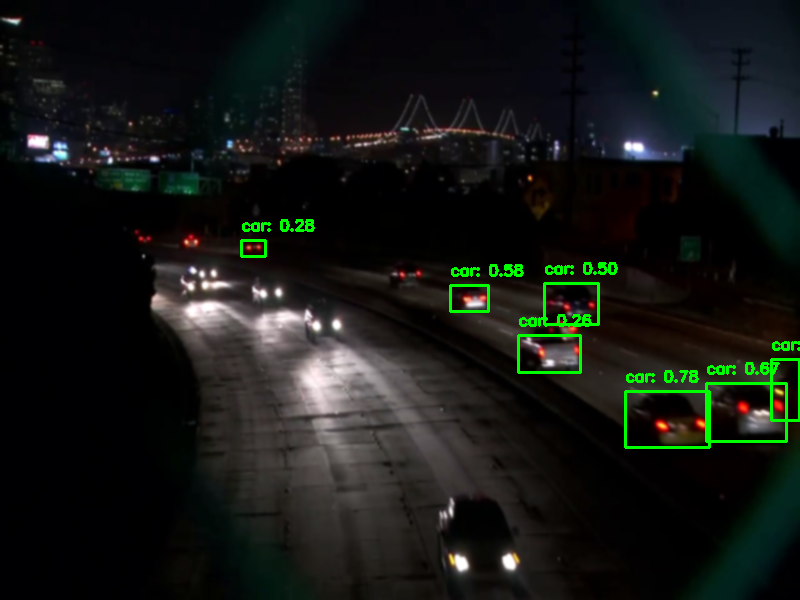

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_8 examples


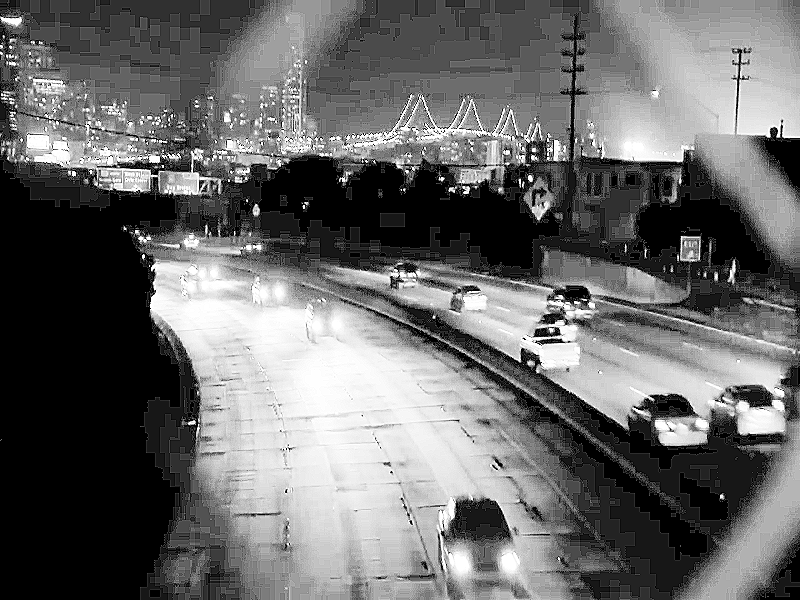


0: 480x640 2 cars, 216.9ms
Speed: 4.9ms preprocess, 216.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


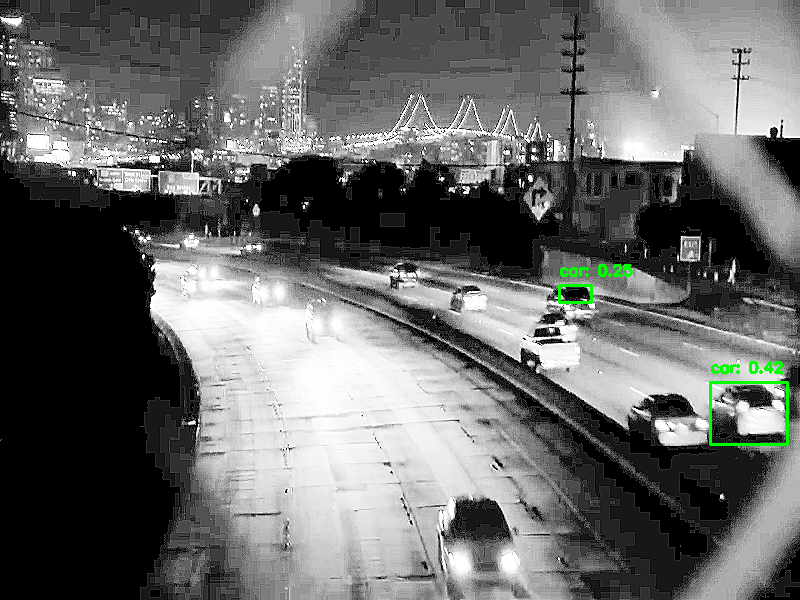

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_9 examples


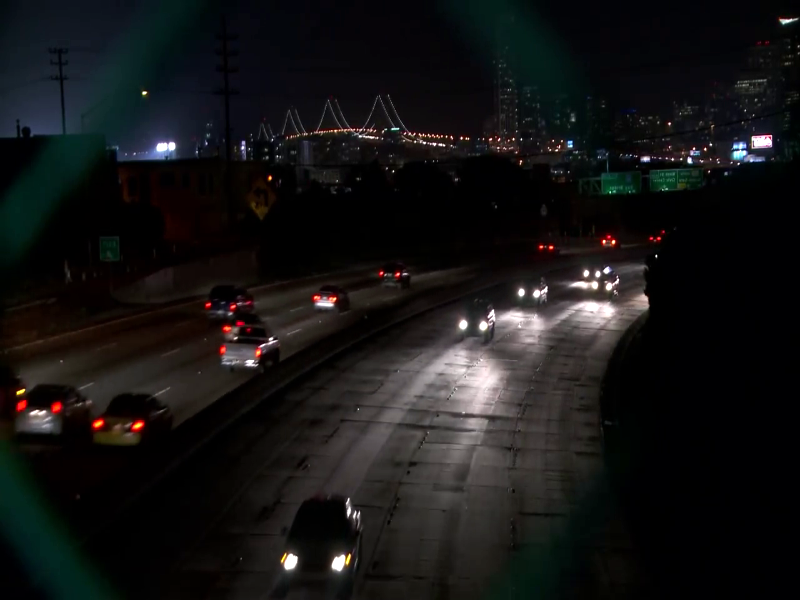


0: 480x640 1 person, 7 cars, 219.2ms
Speed: 5.1ms preprocess, 219.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


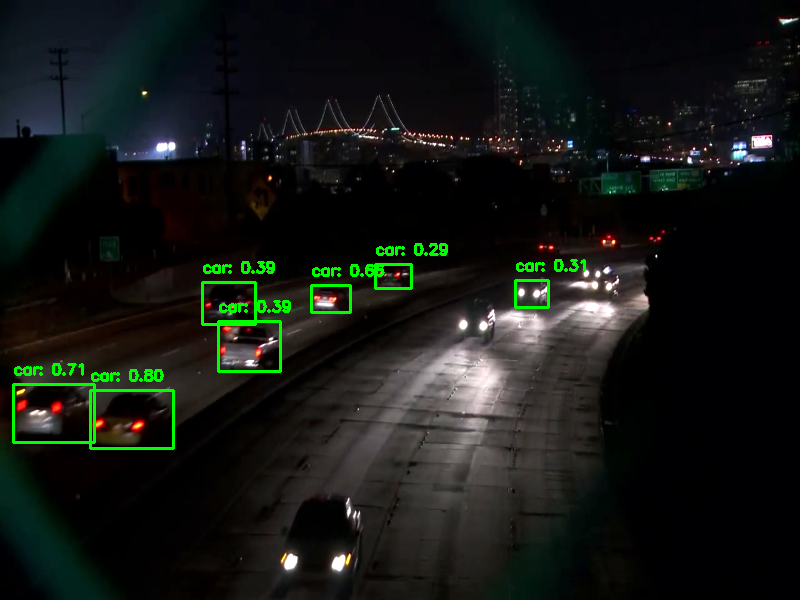

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_10 examples


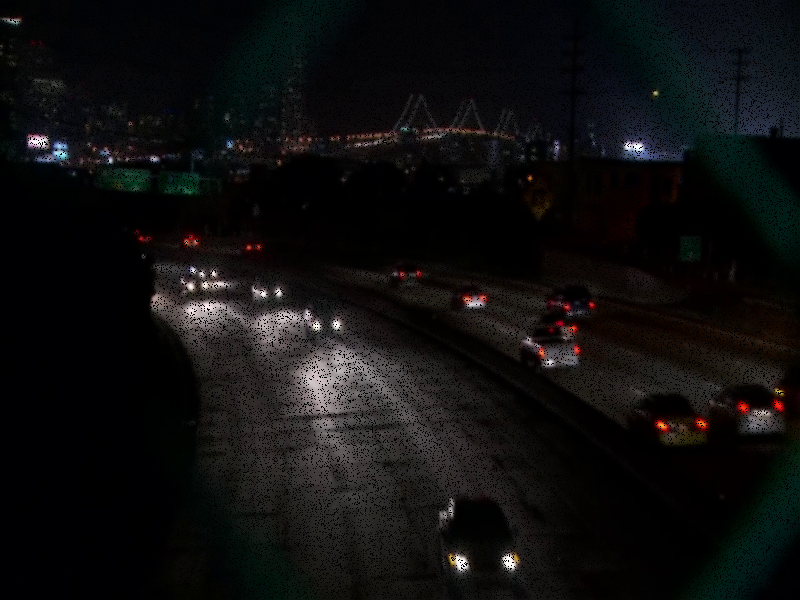


0: 480x640 5 cars, 283.9ms
Speed: 4.8ms preprocess, 283.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


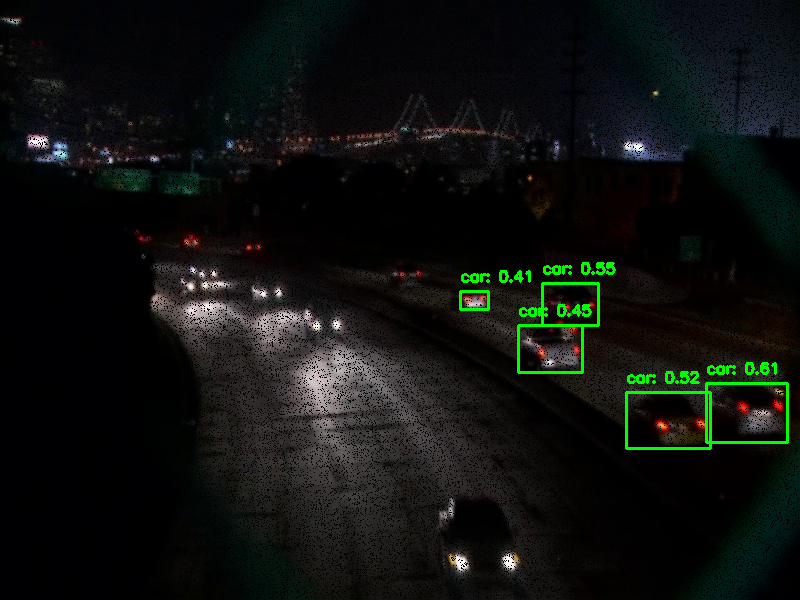

------------------------------------------------------------------------------------------------------------------------------------------------------


preprocess_11 examples


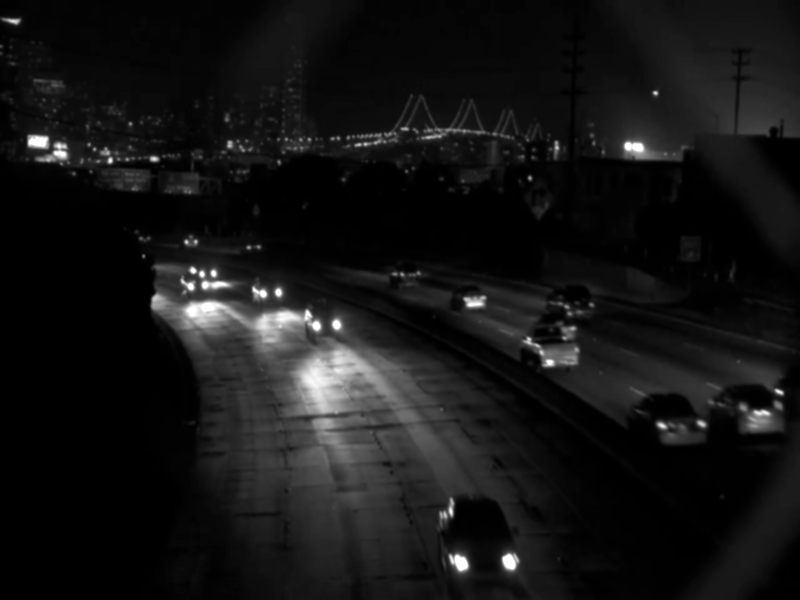


0: 480x640 6 cars, 302.2ms
Speed: 5.8ms preprocess, 302.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


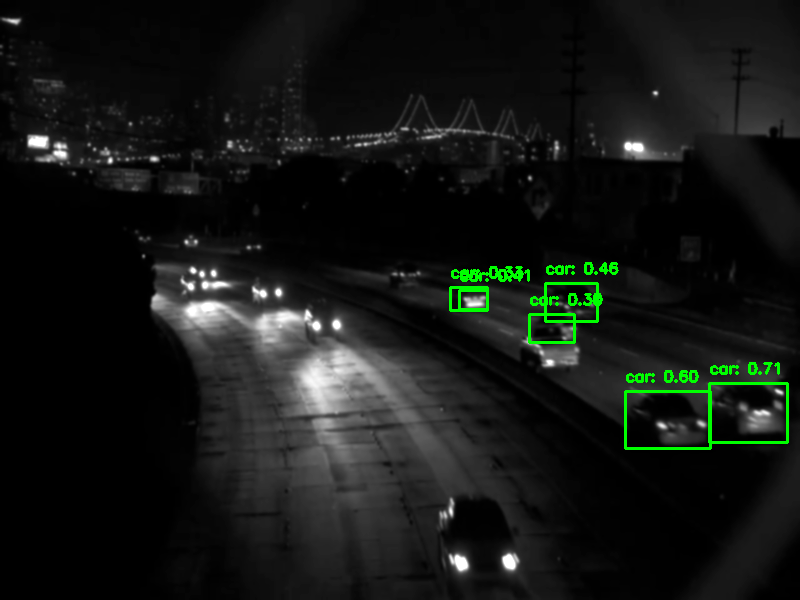

------------------------------------------------------------------------------------------------------------------------------------------------------




In [ ]:
i = 1
func_name = 'preprocess_'
while func_name+str(i) in globals():
  print(func_name+str(i), 'examples')
  preprocessing_func = globals()[func_name+str(i)]

  X_preprocessed = list(map(preprocessing_func, [X[example_index]]))
  cv2_imshow(X_preprocessed[0])
  detect_cars_yolo8(X_preprocessed[0], return_boxes=True)

  i += 1
  print('-'*150+'\n'*2)

In [ ]:
def is_empty(lst):
  return len(lst) == 0

In [ ]:
def bbox_to_minmax(bbox):
    x, y, width, height = bbox
    return [x, y, x + width, y + height]

def compute_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = inter_area / (box1_area + box2_area - inter_area)
    return iou

def smooth_l1_loss(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    diff = np.abs(y_true - y_pred)
    loss = np.where(diff < 1, 0.5 * diff ** 2, diff - 0.5)
    return np.sum(loss)

def cross_entropy_loss(y_true, y_pred):
    epsilon = 1e-6
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    loss = -np.sum(y_true * np.log(y_pred + epsilon))
    return loss

def compute_loss_and_accuracy(y_true, y_pred, lambda_bbox=1.0, lambda_cls=1.0):
    true_bboxes, true_class_ids = y_true
    pred_bboxes, pred_class_ids = y_pred

    if is_empty(true_bboxes) and is_empty(pred_bboxes):
        return 0.0, 1.0
    if (is_empty(true_bboxes) and not is_empty(pred_bboxes)) or (not is_empty(true_bboxes) and is_empty(pred_bboxes)):
        return 200, 0.0

    # true_bboxes = [bbox_to_minmax(bbox) for bbox in true_bboxes]
    # pred_bboxes = [bbox_to_minmax(bbox) for bbox in pred_bboxes]
    true_class_ids = true_class_ids.astype(int)
    pred_class_ids = pred_class_ids.astype(int)
    num_classes = max(max(true_class_ids, default=0), max(pred_class_ids, default=0)) + 1
    num_classes = int(num_classes)
    eyed_clasess = np.eye(num_classes)
    true_class_one_hot = [eyed_clasess[class_id] for class_id in true_class_ids]
    pred_class_one_hot = [eyed_clasess[class_id] for class_id in pred_class_ids]

    # true_class_one_hot = np.eye(num_classes)[true_class_ids] if not is_empty(true_class_ids) else np.zeros((0, num_classes))
    # pred_class_one_hot = np.eye(num_classes)[pred_class_ids] if not is_empty(pred_class_ids) else np.zeros((0, num_classes))

    matched_indices = []
    for i, pred_bbox in enumerate(pred_bboxes):
        best_iou = 0
        best_match_idx = -1
        for j, true_bbox in enumerate(true_bboxes):
            iou = compute_iou(pred_bbox, true_bbox)
            if iou > best_iou:
                best_iou = iou
                best_match_idx = j
        matched_indices.append((i, best_match_idx))

    bbox_loss = 0
    cls_loss = 0
    correct_classifications = 0
    total_matches = 0
    for pred_idx, true_idx in matched_indices:
        if true_idx != -1:
            bbox_loss += smooth_l1_loss(true_bboxes[true_idx], pred_bboxes[pred_idx])
            cls_loss += cross_entropy_loss(true_class_one_hot[true_idx], pred_class_one_hot[pred_idx])
            if pred_class_ids[pred_idx] == true_class_ids[true_idx]:
                correct_classifications += 1
            total_matches += 1

    total_loss = lambda_bbox * bbox_loss + lambda_cls * cls_loss

    accuracy = correct_classifications / total_matches if total_matches > 0 else 0

    return total_loss, accuracy

In [ ]:
def object_detection_loss_and_accuracy(y_pred, y_true, alpha=1.0):
    """
    Args:
        y_pred (list): A list of tuples containing two elements:
            - boxes (np.array): Predicted bounding boxes (num_boxes, 4).
            - class_scores (np.array): Predicted class scores (num_boxes, num_classes).
        y_true (list): A list of tuples containing two elements:
            - boxes (np.array): Ground truth bounding boxes (num_boxes, 4).
            - class_ids (np.array): Ground truth class labels (num_boxes).
        alpha (float): Weighting factor for classification loss.

    Returns:
        loss (Tensor): Combined loss.
        accuracy (float): Classification accuracy.
    """
    # Check if y_pred or y_true is empty
    if not y_pred or not y_true:
        return torch.tensor(0.0), 0.0

    # Initialize lists to collect results
    pred_boxes_list = []
    pred_scores_list = []
    true_boxes_list = []
    true_labels_list = []

    # Find the maximum number of boxes in the batch
    max_num_boxes = max(len(pred[0]) for pred in y_pred)

    # Iterate over the predictions and ground truths
    for pred, true in zip(y_pred, y_true):
        # Check for empty bounding boxes or class scores
        if pred[0].size == 0 or pred[1].size == 0 or true[0].size == 0 or true[1].size == 0:
            continue

        num_boxes = pred[0].shape[0]
        num_classes = pred[1].shape[1]

        # Pad the bounding boxes and class scores to the maximum number of boxes
        padded_pred_boxes = np.zeros((max_num_boxes, 4))
        padded_pred_scores = np.zeros((max_num_boxes, num_classes))
        padded_true_boxes = np.zeros((max_num_boxes, 4))
        padded_true_labels = np.zeros(max_num_boxes, dtype=np.int64)

        padded_pred_boxes[:num_boxes] = pred[0]
        padded_pred_scores[:num_boxes] = pred[1]
        padded_true_boxes[:num_boxes] = true[0]
        padded_true_labels[:num_boxes] = true[1]

        pred_boxes_list.append(torch.tensor(padded_pred_boxes, dtype=torch.float32))
        pred_scores_list.append(torch.tensor(padded_pred_scores, dtype=torch.float32))
        true_boxes_list.append(torch.tensor(padded_true_boxes, dtype=torch.float32))
        true_labels_list.append(torch.tensor(padded_true_labels, dtype=torch.long))

    # If all elements were skipped due to being empty, return zero loss and accuracy
    if not pred_boxes_list or not pred_scores_list or not true_boxes_list or not true_labels_list:
        return torch.tensor(0.0), 0.0

    pred_boxes = torch.stack(pred_boxes_list)
    pred_scores = torch.stack(pred_scores_list)
    true_boxes = torch.stack(true_boxes_list)
    true_labels = torch.stack(true_labels_list)

    # Localization loss
    loc_loss = F.smooth_l1_loss(pred_boxes, true_boxes)

    # Classification loss
    batch_size, num_boxes, num_classes = pred_scores.shape
    pred_scores = pred_scores.view(-1, num_classes)
    true_labels = true_labels.view(-1)
    cls_loss = F.cross_entropy(pred_scores, true_labels)

    # Combined loss
    loss = loc_loss + alpha * cls_loss

    # Calculate accuracy
    with torch.no_grad():
        pred_labels = torch.argmax(pred_scores, dim=1)
        correct = (pred_labels == true_labels).sum().item()
        total = true_labels.size(0)
        accuracy = correct / total

    return loss, accuracy

# Create sample y_true and y_pred
y_true_example = [
    (np.array([[236, 155,  42,  64],
               [349, 171,  45,  67],
               [372, 256,  51,  96],
               [371, 254,  62,  99],
               [ 77, 309,  86, 106],
               [ 75, 311,  87, 102],
               [ 75, 303,  86, 114],
               [ 80, 310,  85, 102],
               [ 75, 308, 100, 103],
               [ 80, 301,  87, 117],
               [ 78, 322,  79,  95]]),
     np.array([2, 7, 7, 7, 2, 2, 2, 2, 2, 2, 2]))
]

num_classes = 10  # Assuming 10 classes for this example
pred_scores_example = np.random.rand(1, 11, num_classes)

y_pred_example = [
    (np.array([[236, 155,  42,  64],
               [349, 171,  45,  67],
               [372, 256,  51,  96],
               [371, 254,  62,  99],
               [ 77, 309,  86, 106],
               [ 75, 311,  87, 102],
               [ 75, 303,  86, 114],
               [ 80, 310,  85, 102],
               [ 75, 308, 100, 103],
               [ 80, 301,  87, 117],
               [ 78, 322,  79,  95]]),
     pred_scores_example[0])
]

loss, accuracy = object_detection_loss_and_accuracy(y_pred_example, y_true_example, alpha=1.0)
loss_int = int(loss.item())
print("Loss as integer:", loss_int)
print("Accuracy:", accuracy)

# Test with empty lists
y_true_empty = [(np.array([]).reshape(0, 4), np.array([]))]
y_pred_empty = [(np.array([]).reshape(0, 4), np.random.rand(0, num_classes))]

loss, accuracy = object_detection_loss_and_accuracy(y_pred_empty, y_true_empty, alpha=1.0)
loss_int = int(loss.item())
print("Loss with empty lists:", loss_int)
print("Accuracy with empty lists:", accuracy)

Loss as integer: 2
Accuracy: 0.09090909090909091
Loss with empty lists: 0
Accuracy with empty lists: 0.0


In [ ]:
def run_preprocessing_methods_1():
  i = 1
  func_name = 'preprocess_'
  while func_name+str(i) in globals():
    print(func_name+str(i), 'evalutions:')
    i += 1

    losses = []
    total_loss = 0
    accuracies = []

    y_hat = []
    total_loss = 0
    preprocessed_X = list(map(preprocessing_func, X))
    extract_labels(preprocessed_X, y_hat, detect_cars_yolo8)

    for index in range(len(y)):
      loss, accuracy = compute_loss_and_accuracy(y[index], y_hat[index])
      total_loss += loss
      accuracies.append(accuracy)
      losses.append(loss)

    plt.title('accuracy report')
    plt.plot(accuracies)
    plt.show()

    plt.title('loss report')
    plt.plot(losses)
    plt.show()

    print(f'loss: {total_loss}')
    print('\n'*2)

In [ ]:
def run_preprocessing_methods_2():
  i = 1
  func_name = 'preprocess_'
  accuracies = []
  losses = []
  while func_name+str(i) in globals():
    preprocessing_func = globals()[func_name+str(i)]
    print(preprocessing_func, 'evalutions:')
    i += 1


    y_hat = []
    total_loss = 0
    preprocessed_X = list(map(preprocessing_func, X))
    extract_labels(preprocessed_X, y_hat, detect_cars_yolo8)

    total_loss, accuracy = object_detection_loss_and_accuracy(y_hat, y, alpha=1.0)
    print(f'loss: {total_loss}')
    print(f'accuracy: {accuracy}\n')

  plt.title('accuracy report')
  plt.plot(accuracies)
  plt.show()

  plt.title('loss report')
  plt.plot(losses)
  plt.show()

preprocess_1 evalutions:

0: 480x640 2 persons, 5 cars, 185.9ms
Speed: 5.3ms preprocess, 185.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 178.4ms
Speed: 5.0ms preprocess, 178.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 175.0ms
Speed: 5.3ms preprocess, 175.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 173.9ms
Speed: 5.1ms preprocess, 173.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 174.1ms
Speed: 5.2ms preprocess, 174.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 174.8ms
Speed: 5.1ms preprocess, 174.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 275.4ms
Speed: 4.0ms preprocess, 275.4ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 pers

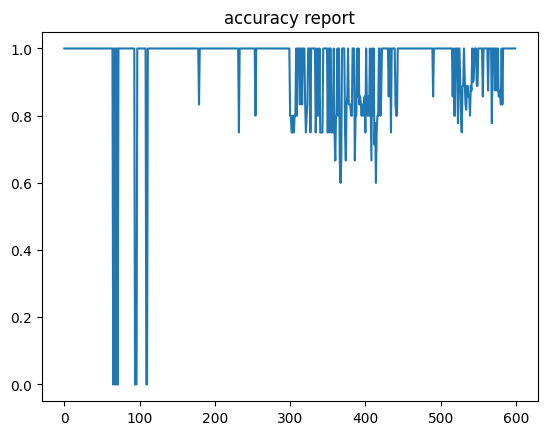

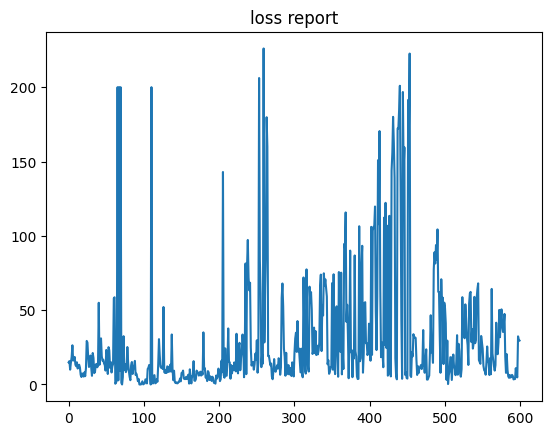

loss: 17975.23827902859



preprocess_2 evalutions:

0: 480x640 2 persons, 5 cars, 182.1ms
Speed: 5.8ms preprocess, 182.1ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 174.5ms
Speed: 4.0ms preprocess, 174.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 183.6ms
Speed: 4.0ms preprocess, 183.6ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 179.5ms
Speed: 4.2ms preprocess, 179.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 171.4ms
Speed: 6.0ms preprocess, 171.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 265.0ms
Speed: 4.0ms preprocess, 265.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 268.7ms
Speed: 5.3ms preprocess, 268.7ms inference, 1.9ms postprocess per image at shape (1, 3, 4

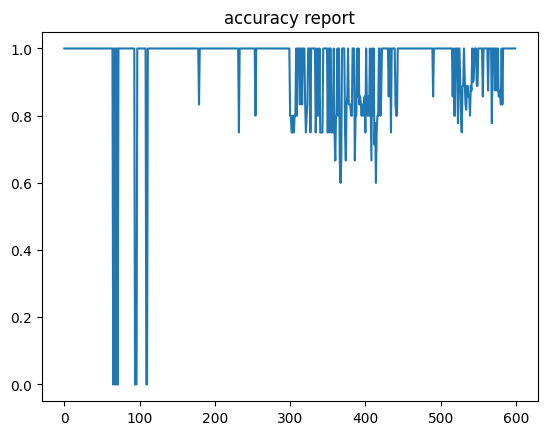

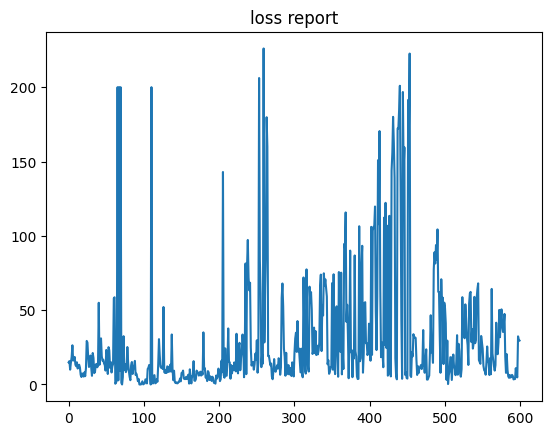

loss: 17975.23827902859



preprocess_3 evalutions:

0: 480x640 2 persons, 5 cars, 172.6ms
Speed: 3.9ms preprocess, 172.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 169.6ms
Speed: 3.7ms preprocess, 169.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 182.2ms
Speed: 3.8ms preprocess, 182.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 178.1ms
Speed: 3.9ms preprocess, 178.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 185.1ms
Speed: 4.4ms preprocess, 185.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 174.7ms
Speed: 4.9ms preprocess, 174.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 280.9ms
Speed: 4.1ms preprocess, 280.9ms inference, 1.7ms postprocess per image at shape (1, 3, 4

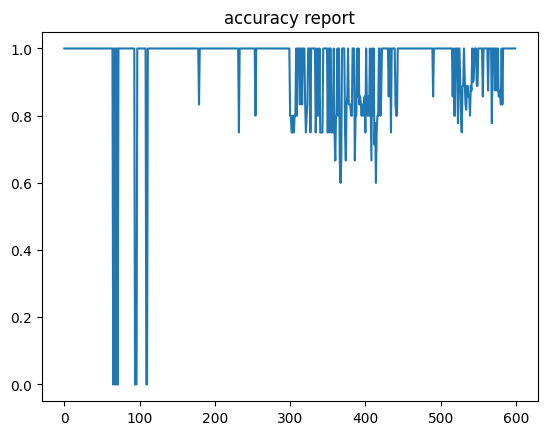

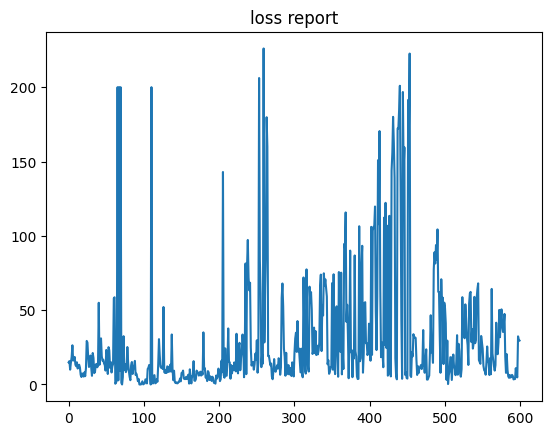

loss: 17975.23827902859



preprocess_4 evalutions:

0: 480x640 2 persons, 5 cars, 167.1ms
Speed: 6.3ms preprocess, 167.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 265.3ms
Speed: 4.0ms preprocess, 265.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 299.8ms
Speed: 3.8ms preprocess, 299.8ms inference, 3.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 176.5ms
Speed: 3.9ms preprocess, 176.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 168.6ms
Speed: 3.8ms preprocess, 168.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 167.9ms
Speed: 4.5ms preprocess, 167.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 182.7ms
Speed: 4.6ms preprocess, 182.7ms inference, 1.3ms postprocess per image at shape (1, 3, 4

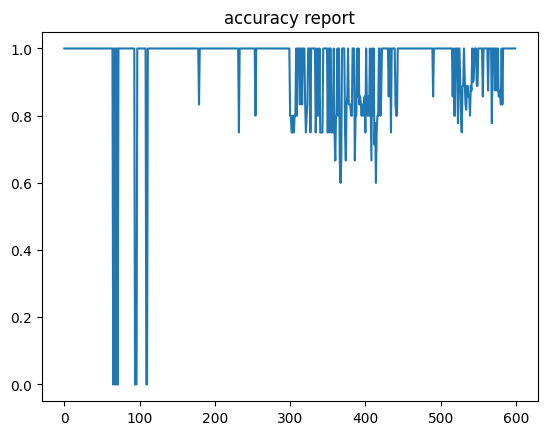

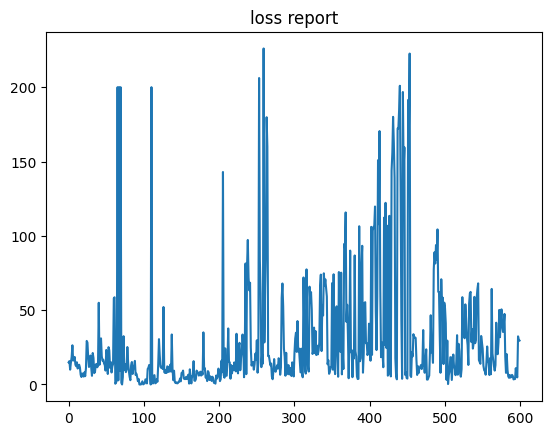

loss: 17975.23827902859



preprocess_5 evalutions:

0: 480x640 2 persons, 5 cars, 201.7ms
Speed: 5.1ms preprocess, 201.7ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 186.4ms
Speed: 4.7ms preprocess, 186.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 193.8ms
Speed: 4.3ms preprocess, 193.8ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 195.5ms
Speed: 4.2ms preprocess, 195.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 188.1ms
Speed: 4.0ms preprocess, 188.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 194.1ms
Speed: 4.1ms preprocess, 194.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 288.0ms
Speed: 4.3ms preprocess, 288.0ms inference, 2.2ms postprocess per image at shape (1, 3, 4

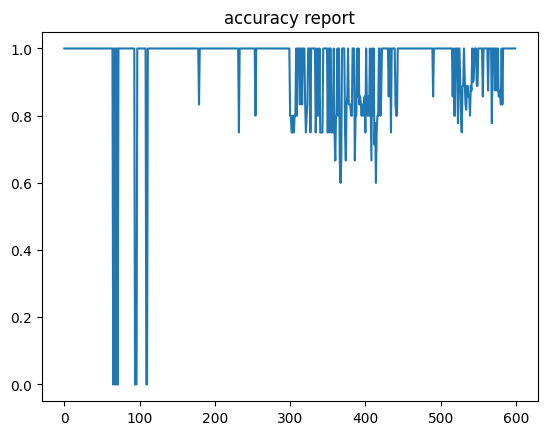

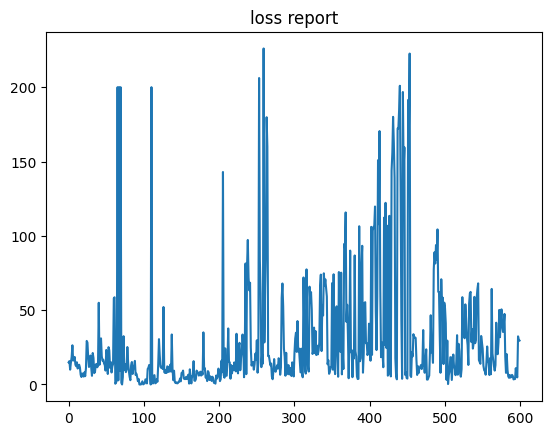

loss: 17975.23827902859



preprocess_6 evalutions:

0: 480x640 2 persons, 5 cars, 285.8ms
Speed: 5.3ms preprocess, 285.8ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 193.1ms
Speed: 3.9ms preprocess, 193.1ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 189.1ms
Speed: 6.9ms preprocess, 189.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 184.2ms
Speed: 3.8ms preprocess, 184.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 186.0ms
Speed: 6.9ms preprocess, 186.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 183.5ms
Speed: 3.9ms preprocess, 183.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 176.3ms
Speed: 5.9ms preprocess, 176.3ms inference, 1.3ms postprocess per image at shape (1, 3, 4

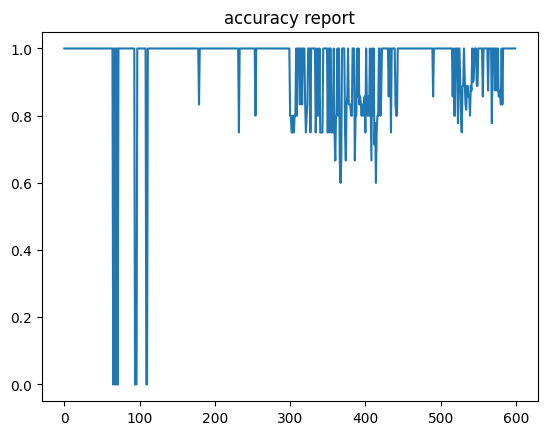

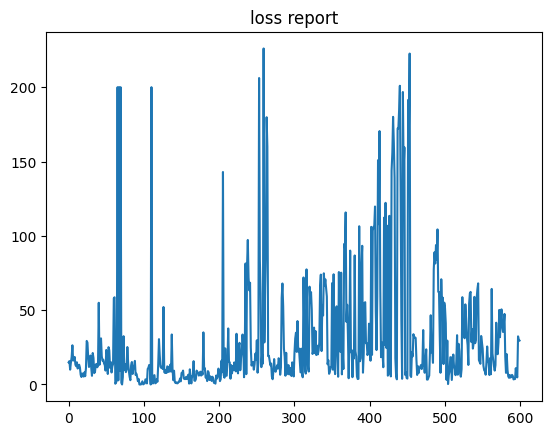

loss: 17975.23827902859



preprocess_7 evalutions:

0: 480x640 2 persons, 5 cars, 160.9ms
Speed: 3.6ms preprocess, 160.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 172.2ms
Speed: 3.7ms preprocess, 172.2ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 164.5ms
Speed: 3.7ms preprocess, 164.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 244.7ms
Speed: 4.6ms preprocess, 244.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 255.1ms
Speed: 5.2ms preprocess, 255.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 161.9ms
Speed: 4.3ms preprocess, 161.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 164.5ms
Speed: 5.9ms preprocess, 164.5ms inference, 1.1ms postprocess per image at shape (1, 3, 4

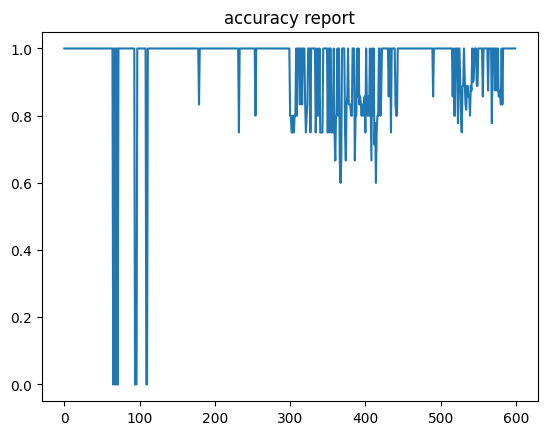

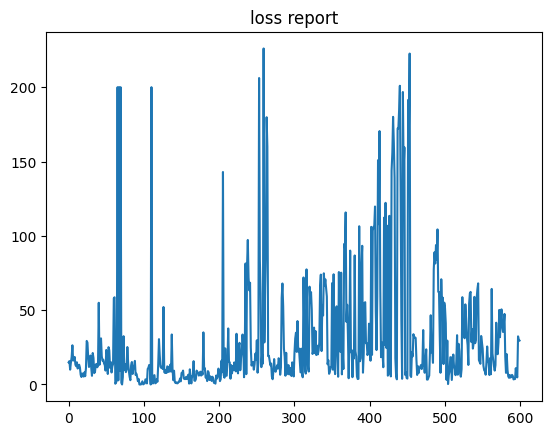

loss: 17975.23827902859



preprocess_8 evalutions:

0: 480x640 2 persons, 5 cars, 224.4ms
Speed: 4.5ms preprocess, 224.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 238.9ms
Speed: 3.7ms preprocess, 238.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 160.8ms
Speed: 3.6ms preprocess, 160.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 154.9ms
Speed: 5.3ms preprocess, 154.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 155.3ms
Speed: 6.6ms preprocess, 155.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 165.2ms
Speed: 3.7ms preprocess, 165.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 160.8ms
Speed: 4.2ms preprocess, 160.8ms inference, 1.8ms postprocess per image at shape (1, 3, 4

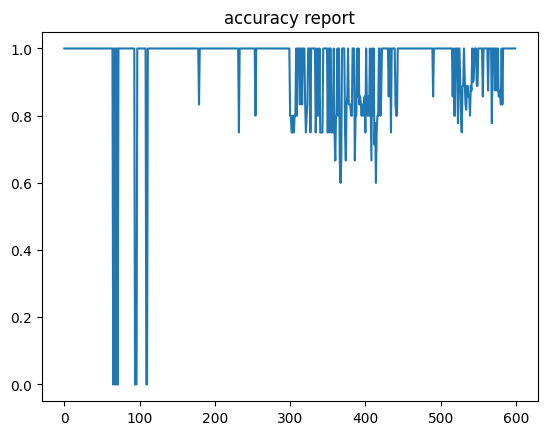

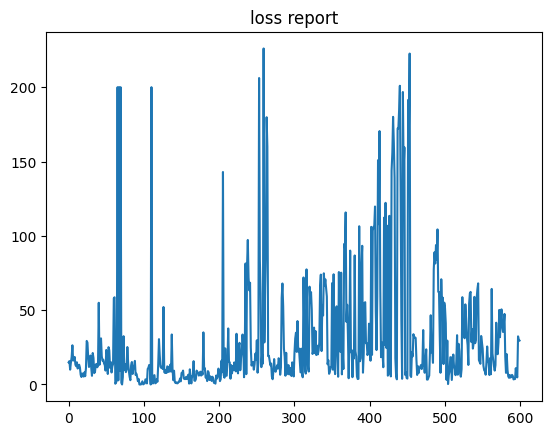

loss: 17975.23827902859



preprocess_9 evalutions:

0: 480x640 2 persons, 5 cars, 251.3ms
Speed: 4.1ms preprocess, 251.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 184.0ms
Speed: 4.0ms preprocess, 184.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 194.4ms
Speed: 3.9ms preprocess, 194.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 275.8ms
Speed: 4.0ms preprocess, 275.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 287.5ms
Speed: 4.0ms preprocess, 287.5ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 198.7ms
Speed: 4.0ms preprocess, 198.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 181.8ms
Speed: 4.0ms preprocess, 181.8ms inference, 1.4ms postprocess per image at shape (1, 3, 4

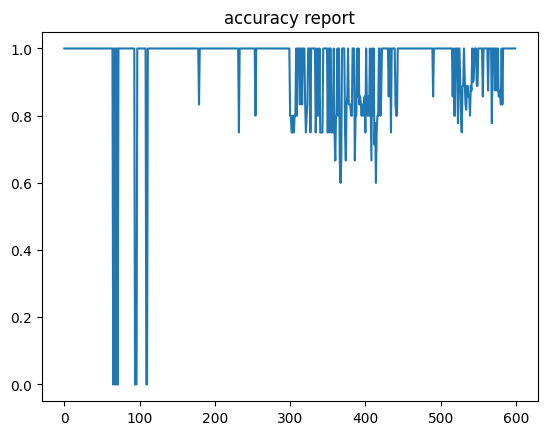

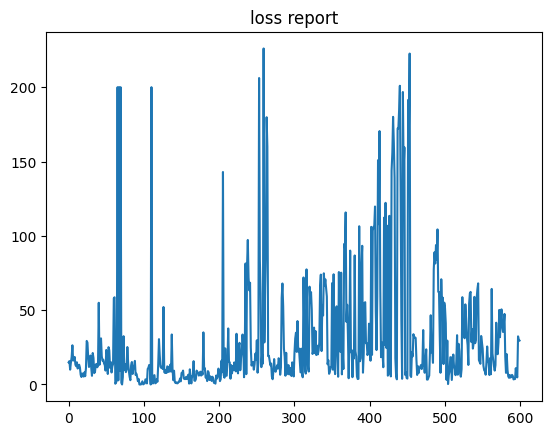

loss: 17975.23827902859



preprocess_10 evalutions:

0: 480x640 2 persons, 5 cars, 164.8ms
Speed: 5.9ms preprocess, 164.8ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 145.9ms
Speed: 3.3ms preprocess, 145.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 155.5ms
Speed: 3.4ms preprocess, 155.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 157.7ms
Speed: 4.7ms preprocess, 157.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 158.6ms
Speed: 4.8ms preprocess, 158.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 173.8ms
Speed: 3.7ms preprocess, 173.8ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 221.5ms
Speed: 3.6ms preprocess, 221.5ms inference, 1.7ms postprocess per image at shape (1, 3, 

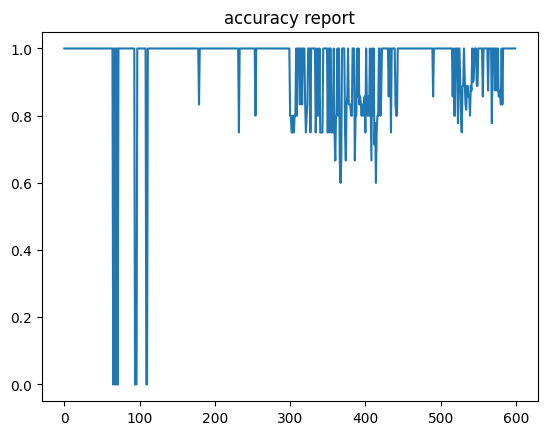

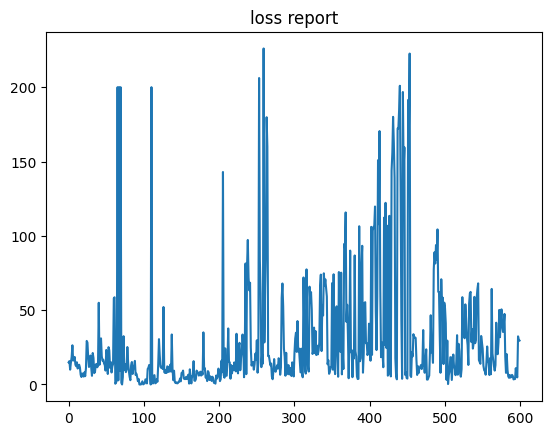

loss: 17975.23827902859



preprocess_11 evalutions:

0: 480x640 2 persons, 5 cars, 156.7ms
Speed: 3.5ms preprocess, 156.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 167.4ms
Speed: 3.6ms preprocess, 167.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 6 cars, 154.8ms
Speed: 4.8ms preprocess, 154.8ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 5 cars, 156.2ms
Speed: 3.5ms preprocess, 156.2ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 6 cars, 155.4ms
Speed: 4.2ms preprocess, 155.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 7 cars, 225.9ms
Speed: 3.4ms preprocess, 225.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 7 cars, 224.6ms
Speed: 3.9ms preprocess, 224.6ms inference, 1.1ms postprocess per image at shape (1, 3, 

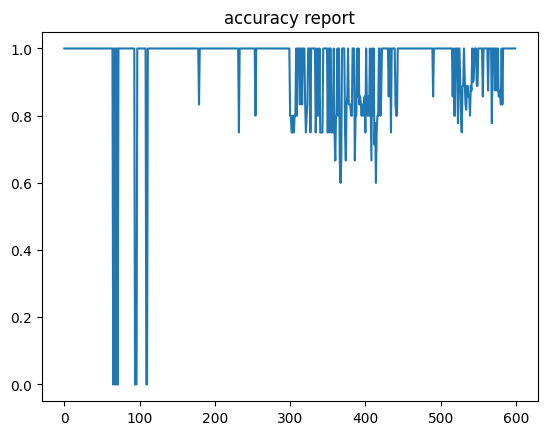

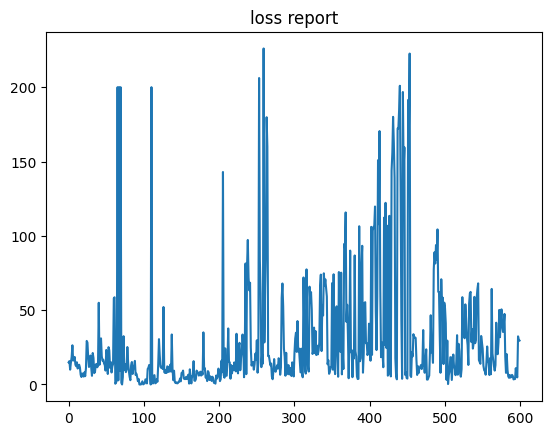

loss: 17975.23827902859





In [ ]:
run_preprocessing_methods_1()